<a href="https://colab.research.google.com/github/TMTMPST/2341720112-Mobile-Semester-V/blob/main/Week3_29.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# D1 Operasi Citra Sederhana

In [14]:
from google.colab import drive
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


 Mengubah tingkat kecerahan cahaya 
-----------------------------------
Masukkan nilai kecerahan : 50


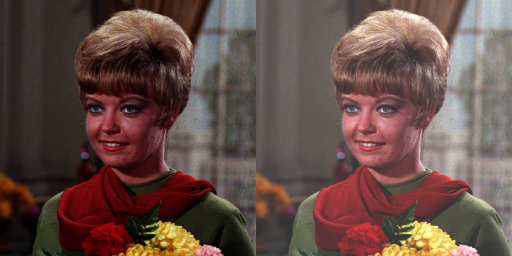

In [15]:
print(' Mengubah tingkat kecerahan cahaya ')
print('-----------------------------------')
try:
  brightness = int(input('Masukkan nilai kecerahan : '))
except ValueError:
  print('Error, not a number')

original = cv2.imread('/content/drive/MyDrive/PCVK25_3G_29/img/Jobsheet3/female.tiff')
brightness_image = np.zeros(original.shape, original.dtype)

# for y in range(original.shape[0]):
#   for x in range(original.shape[1]):
#     for c in range(original.shape[2]):
#       brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

brightness_image = cv2.convertScaleAbs(original, beta = brightness)

final_frame = cv2.hconcat((original, brightness_image))
cv2_imshow(final_frame)

## Tugas Praktikum D1

### 1. Implementasikan inverse citra pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

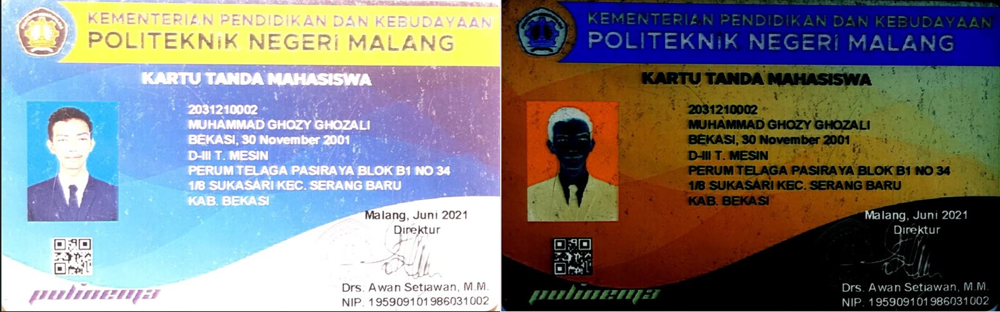

In [16]:
ktm = cv2.imread('/content/drive/MyDrive/PCVK25_3G_29/img/Jobsheet3/KTM lama.jpg')
negative = 255 - ktm

frame = cv2.hconcat((ktm, negative))
cv2_imshow(frame)


### 2. Implementasikan transformasi contrast pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori untuk kontras, sehingga menghasilkan keluaran seperti berikut:

 Mengubah tingkat kecerahan cahaya 
-----------------------------------
Masukkan nilai kecerahan : 50
Masukkan nilai Contrast : 2


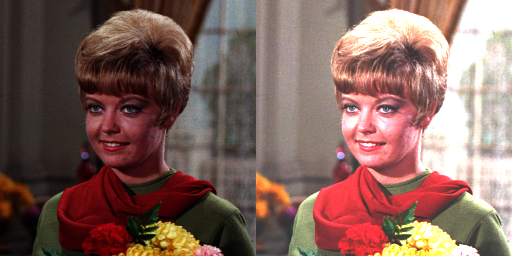

In [17]:
print(' Mengubah tingkat kecerahan cahaya ')
print('-----------------------------------')
try:
  brightness = int(input('Masukkan nilai kecerahan : '))
  contrast = float(input('Masukkan nilai Contrast : '))
except ValueError:
  print('Error, not a number')

original = cv2.imread('/content/drive/MyDrive/PCVK25_3G_29/img/Jobsheet3/female.tiff')
contast_image = np.zeros(original.shape, original.dtype)

contrast_image = cv2.convertScaleAbs(original, alpha = contrast, beta = brightness)

final_frame = cv2.hconcat((original, contrast_image))
cv2_imshow(final_frame)

### 3. Implementasikan transformasi logarithmic brightness pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori untuk transformasi log, sehingga menghasilkan keluaran seperti berikut:

 Mengubah tingkat kecerahan cahaya 
-----------------------------------
Masukkan nilai kecerahan : 50


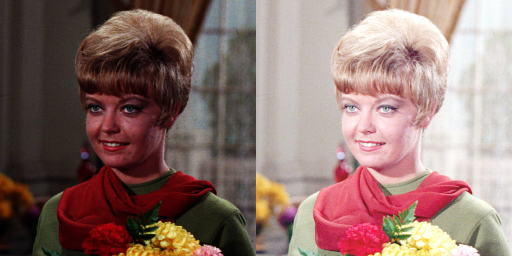

In [18]:
print(' Mengubah tingkat kecerahan cahaya ')
print('-----------------------------------')
try:
    brightnessLog = int(input('Masukkan nilai kecerahan : '))
except ValueError:
    print('Error, not a number')

brightnessLog_image = np.zeros(original.shape, original.dtype)
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for z in range(original.shape[2]):
            brightnessLog_image[y,x,z] = np.clip(
                brightnessLog * np.log(1 + original[y,x,z]), 0, 255
            )

final_frame = cv2.hconcat((original, brightnessLog_image))
cv2_imshow(final_frame)


### 4. Implementasikan transformasi grayscale menggunakan metode averaging, lightness, dan luminance pada Google Colaboratory menggunakan formula yang terdapat pada bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

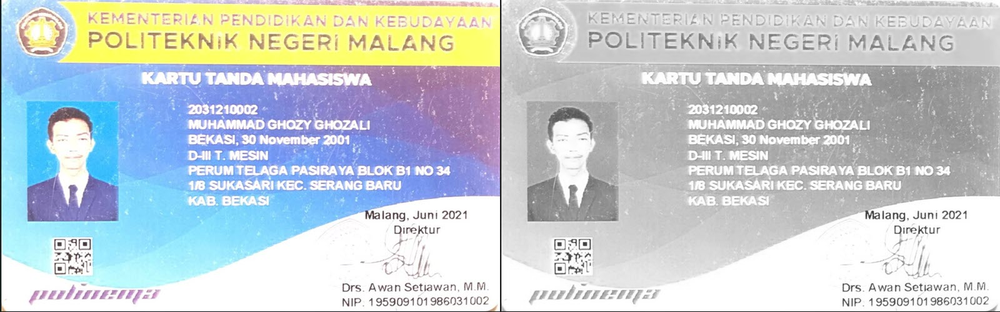

In [19]:
# a. Averaging
original_ktm = cv2.imread('/content/drive/MyDrive/PCVK25_3G_29/img/Jobsheet3/KTM lama.jpg')
ktm_gray_avg = original_ktm.copy()

(row, col) = ktm_gray_avg.shape[0:2]
for i in range(row):
  for j in range(col):
    ktm_gray_avg[i, j] = np.sum(ktm_gray_avg[i, j]) / 3

Avg_frame = cv2.hconcat((original_ktm, ktm_gray_avg))
cv2_imshow(Avg_frame)

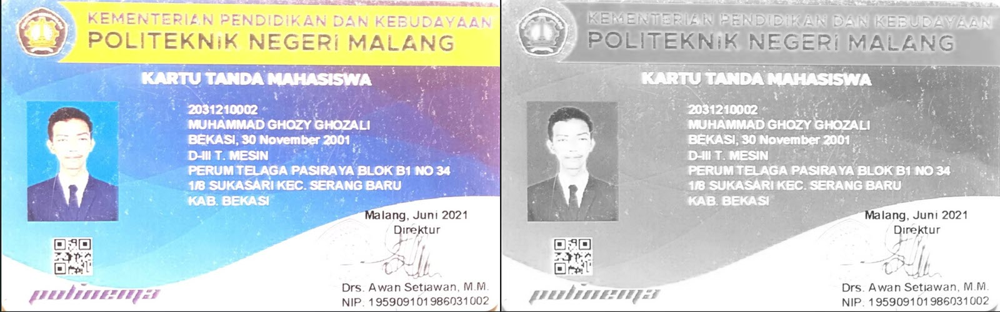

In [20]:
# b. lightness

ktm_gray_light = original_ktm.copy()
ktm_gray_light_32 = ktm_gray_light.astype(np.float32)

(row, col) = ktm_gray_light_32.shape[0:2]
for i in range(row):
    for j in range(col):
        pixel = ktm_gray_light_32[i, j]
        max_val = np.max(pixel)
        min_val = np.min(pixel)
        ktm_gray_light_32[i, j] = (max_val + min_val) / 2

ktm_gray_light_86 = ktm_gray_light_32.astype(np.uint8)
Light_frame = cv2.hconcat((original_ktm, ktm_gray_light_86))
cv2_imshow(Light_frame)

### 5. Tampilkanlah warna tertentu pada citra, dan ubah warna lain menjadi grayscale. Misal,tampilkan warna biru pada citra masukan dan ubah bagian lain yang tidak berwarna Biru menjadi grayscale seperti pada contoh berikut:

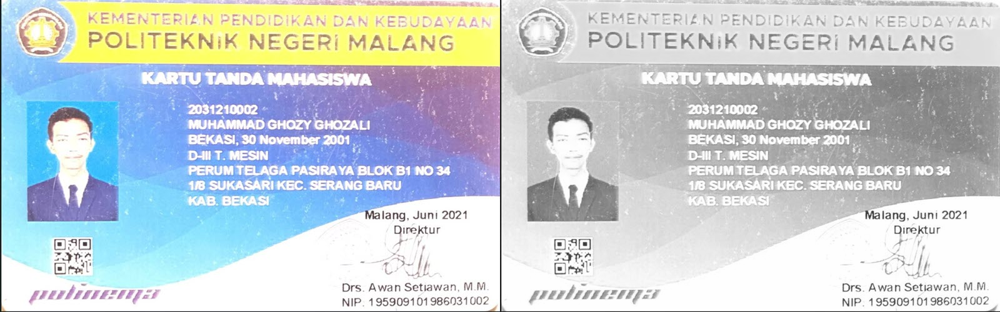

In [21]:
# c. luminance

ktm_gray_lum = original_ktm.copy()
for i in range(ktm_gray_lum.shape[0]):
    for j in range(ktm_gray_lum.shape[1]):
        ktm_gray_lum[i, j] = 0.2126 * original_ktm[i, j, 0] + 0.7152 * original_ktm[i, j, 1] + 0.0722 * original_ktm[i, j, 2]

Lum_frame = cv2.hconcat((original_ktm, ktm_gray_lum))
cv2_imshow(Lum_frame)


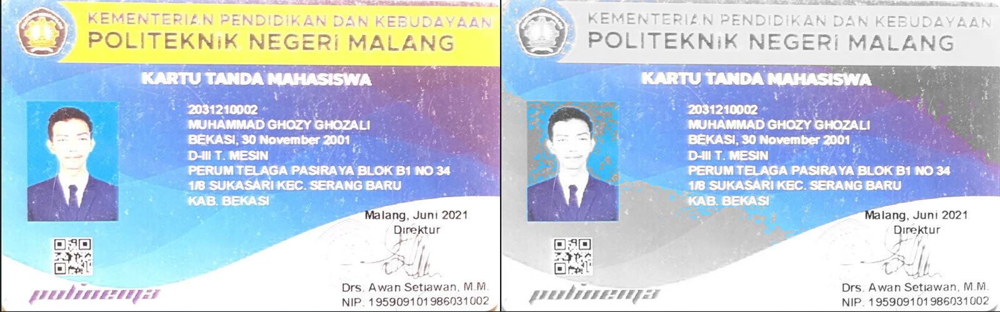

In [22]:
img = original_ktm.copy()
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

lower_blue = np.array([100, 50, 50])
upper_blue = np.array([140, 255, 255])
mask = cv2.inRange(hsv, lower_blue, upper_blue)

blue_part = cv2.bitwise_and(img, img, mask=mask)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray_bgr = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)
result = np.where(mask[:, :, None] != 0, img, gray_bgr)

hsv_frame = cv2.hconcat((original_ktm, result))
cv2_imshow(hsv_frame)


# D2 Operasi Aritmatika dan Logika

## 1. Buat Gamma Correction sesuai dengan petunjuk berikut

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 2


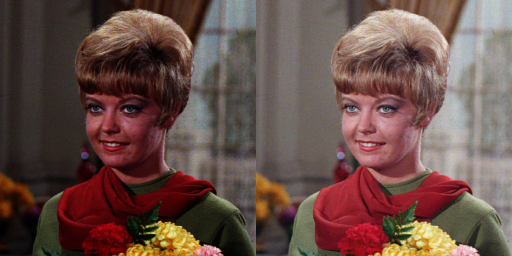

In [24]:
print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
  gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
  print('Error, not a number')

original_gamma = original.copy()

inv_gamma = 1.0/gamma
gamma_image = np.array(255*(original_gamma/255)**inv_gamma, dtype = 'uint8')

final_frame = cv2.hconcat((original_gamma, gamma_image))
cv2_imshow(final_frame)

## 2. Buat Simulasi Image Depth

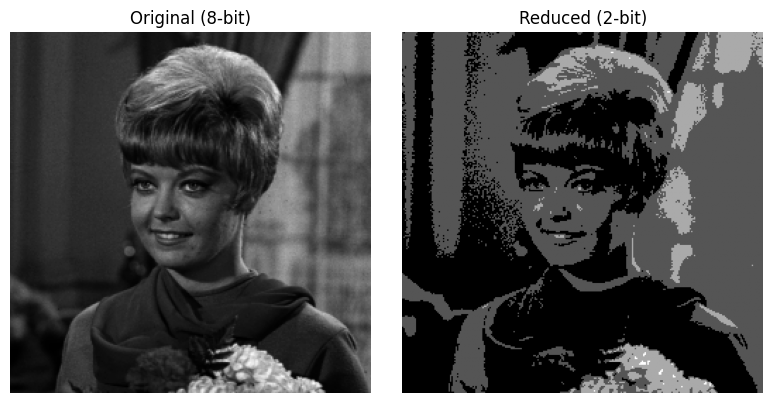

In [27]:
original_gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)

def bit_depth_reduction(image, bit_depth):

    level = 255 / (pow(2, bit_depth) - 1)

    quantized = np.floor(image / level + 0.5) * level
    quantized = np.clip(quantized, 0, 255).astype(np.uint8)
    return quantized

reduced_2bit = bit_depth_reduction(original_gray, 2)

plt.figure(figsize=(8,4))

plt.subplot(1,2,1)
plt.imshow(original_gray, cmap='gray')
plt.title("Original (8-bit)")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(reduced_2bit, cmap='gray')
plt.title("Reduced (2-bit)")
plt.axis('off')

plt.tight_layout()
plt.show()

## 3. Buat modul Average Denoising

In [37]:
from math import log10, sqrt
def PSNR(img1, img2):
  mse = np.mean((img1 - img2) ** 2)
  if(mse == 0): # MSE 0 maka tidak ada noise sama sekali, sehingga PSNR tidak memiliki arti
    return 100
  max_pixel = 255.0
  psnr = 20 * log10(max_pixel / sqrt(mse))
  return psnr

   Jumlah Citra di Average  Nilai PSNR (dB)
1                       10        33.835801
2                       20        37.135080
3                       40        41.288857
4                       80        48.366336
5                      100       100.000000


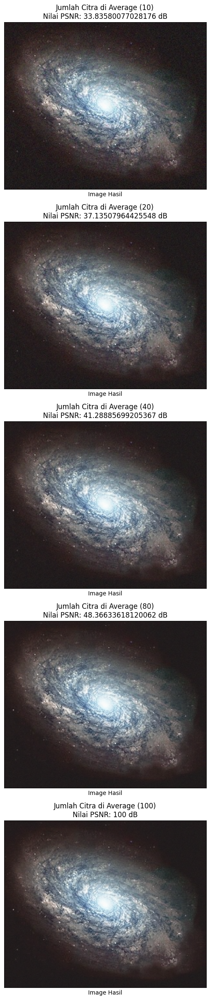

In [38]:
import glob
import pandas as pd


cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK25_3G_29/img/Jobsheet3/noises/*.jpg'):
  n = cv2.imread(img)
  cv_img.append(n)

jumlah_citra_avg = [10, 20, 40, 80, 100]
psnr_values = []
fig, ax = plt.subplots(len(jumlah_citra_avg), 1, figsize=(16, 24))
imagine_image_asli = np.mean(cv_img, axis=0).astype(np.uint8)

for i in range(len(jumlah_citra_avg)):
  imgs = cv_img[:jumlah_citra_avg[i]]
  avg_img = np.mean(imgs, axis=0).astype(np.uint8)
  psnr_value = PSNR(imagine_image_asli, avg_img)
  psnr_values.append(psnr_value)

  ax[i].set_title(f"Jumlah Citra di Average ({jumlah_citra_avg[i]})\nNilai PSNR: {psnr_value} dB")
  ax[i].imshow(avg_img)
  ax[i].set_xlabel(f"Image Hasil")
  ax[i].set_xticks([])
  ax[i].set_yticks([])

df = pd.DataFrame({"Jumlah Citra di Average": jumlah_citra_avg, "Nilai PSNR (dB)": psnr_values})
df.index = range(1, len(df) + 1)
print(df)
plt.tight_layout()
plt.show()

### Dari hasil PSNR yang anda catat pada tabel diatas, kesimpulan yang dapat diambil adalah
> Semakin banyak jumlah citra yang digabungkan melalui proses perataan, tingkat gangguan (noise) pada hasil citra akan semakin berkurang.



## 4. Buat image masking

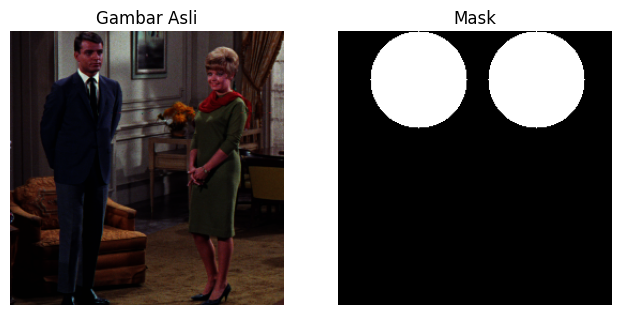

In [39]:
original = cv2.imread('/content/drive/MyDrive/PCVK25_3G_29/img/Jobsheet3/couple.tiff')
original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

mask = np.zeros(original.shape, np.uint8)
WHITE = (255, 255, 255)
cv2.circle(mask, (75, 45), 45, WHITE, -1)
cv2.circle(mask, (185, 45), 45, WHITE, -1)

def make_plot_mask():
  plt.figure(figsize=(12,6))

  plt.subplot(1,3,1)
  plt.title("Gambar Asli")
  plt.imshow(original)
  plt.axis("off")
  plt.subplot(1,3,2)
  plt.title("Mask")
  plt.imshow(mask)
  plt.axis("off")

  return plt

make_plot_mask().show()

### NOT

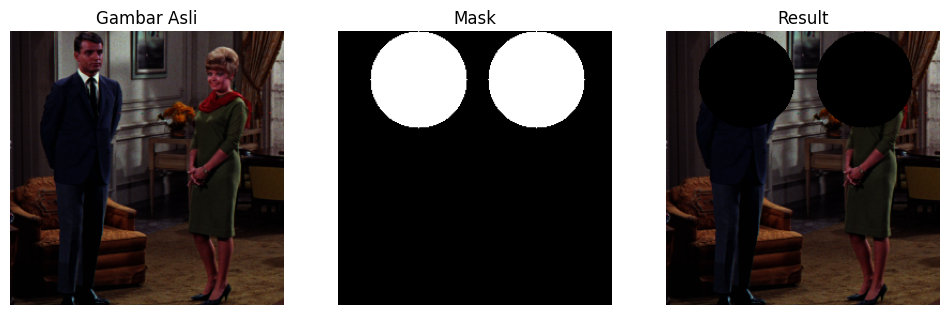

In [40]:
plt = make_plot_mask()

not_mask = cv2.bitwise_not(mask)
result = cv2.bitwise_and(original, not_mask)
plt.subplot(1,3,3)
plt.title("Result")
plt.imshow(result)
plt.axis("off")

plt.show()

### OR

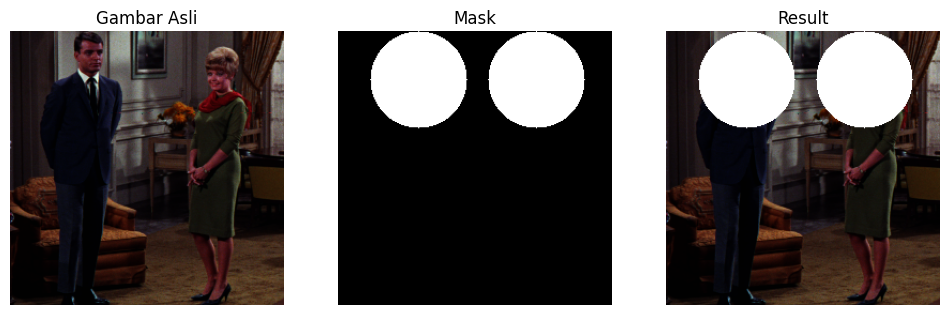

In [41]:
plt = make_plot_mask()

result = cv2.bitwise_or(original, mask)
plt.subplot(1,3,3)
plt.title("Result")
plt.imshow(result)
plt.axis("off")

plt.show()

### AND

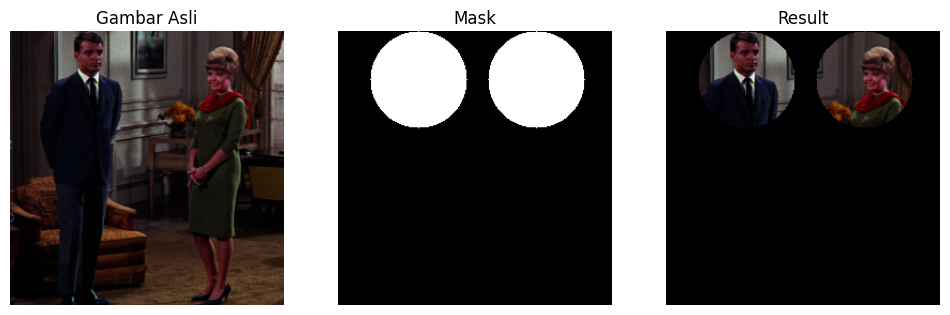

In [42]:
plt = make_plot_mask()

result = cv2.bitwise_and(original, mask)
plt.subplot(1,3,3)
plt.title("Result")
plt.imshow(result)
plt.axis("off")

plt.show()

### NAND

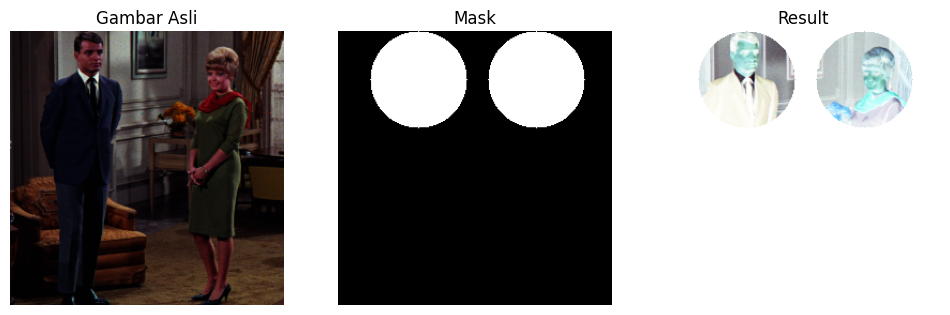

In [43]:
plt = make_plot_mask()

and_mask = cv2.bitwise_and(original, mask)
result = cv2.bitwise_not(and_mask)
plt.subplot(1,3,3)
plt.title("Result")
plt.imshow(result)
plt.axis("off")

plt.show()

### XOR

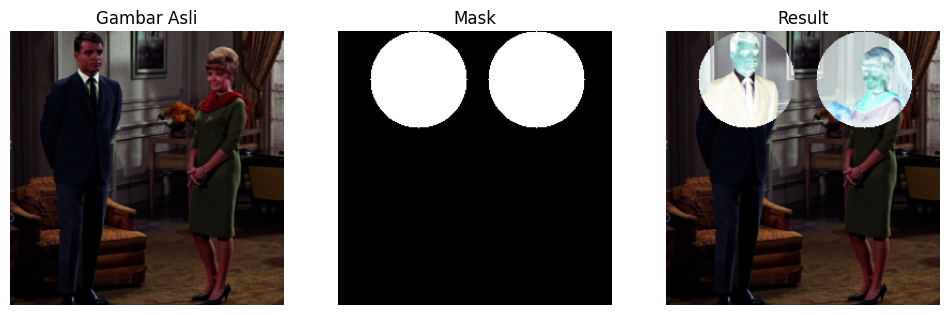

In [44]:
plt = make_plot_mask()

result = cv2.bitwise_xor(original, mask)
plt.subplot(1,3,3)
plt.title("Result")
plt.imshow(result)
plt.axis("off")

plt.show()

### Tuliskan hasil analisa anda
Hasil Analisa Operasi Logika pada Citra
# Hasil Analisa Operasi Logika pada Citra

## 1. NOT (Mask)
Operasi **NOT** membalikkan nilai piksel pada mask, sehingga:
- Area putih → menjadi hitam  
- Area hitam → menjadi putih  

---

## 2. OR
Operasi **OR** menggabungkan informasi antara citra asli dan mask:
- Bagian yang terkena mask → ikut berubah  
- Area lain → tetap mengikuti citra asli  

---

## 3. AND
Operasi **AND** hanya mempertahankan bagian citra pada area putih (mask):
- Area di dalam lingkaran putih → dipertahankan  
- Area di luar lingkaran hitam → menjadi hitam  

---

## 4. NAND
Operasi **NAND** adalah kebalikan dari AND:
- Area yang sebelumnya hitam → menjadi terang  
- Area yang semula terang → menjadi gelap  

---

## 5. XOR
Operasi **XOR** menyoroti perbedaan antara citra dan mask:
- Area dalam lingkaran putih → berubah (karena citra ≠ mask)  
- Area di luar lingkaran → tetap sama dengan citra asli  


